In [2]:
import sys
sys.path.insert(0, "../../.")

import numpy as np
import matplotlib.pyplot as plt
import itertools as it
import pandas as pd

from functions.eval_functions import pval_mac
from functions.general_functions import simulate_step, b_any_series
from seismostats import estimate_b

%config InlineBackend.figure_format ='retina'

# Resolution

In [2]:
n_totals = [
    1000,
    2000,
    3000,
    4000,
    5000,
    7000,
    10000,
    15000,
    20000,
    25000,
    30000,
    35000,
    40000,
    50000,
    100000,
]
delta_bs = np.arange(0, 1.025, 0.025)

all_permutations = [
    i
    for i in it.product(
        n_totals,
        delta_bs,
    )
]
all_permutations = np.array(all_permutations)

# parameter vectors to run through with cl_idx
cl_n_totals = all_permutations[:, 0].astype(int)
cl_delta_bs = all_permutations[:, 1]

In [3]:
np.shape(cl_n_totals)

(615,)

In [12]:
n_totals = [
    1000,
    2000,
    3000,
    4000,
    5000,
    7000,
    10000,
    15000,
    20000,
    25000,
    30000,
    35000,
    40000,
    50000,
]
delta_bs = np.arange(0, 1.025, 0.025)

all_permutations = [
    i
    for i in it.product(
        n_totals,
        delta_bs,
    )
]
all_permutations = np.array(all_permutations)

# parameter vectors to run through with cl_idx
cl_n_totals = all_permutations[:, 0].astype(int)
cl_delta_bs = all_permutations[:, 1]

def get_string_data(cl_idx, n_series = 100):
    if n_series == 25:
        save_str = (
                "results/resolution/constant_idx/"
                "acf_mean" + str(cl_idx) + "_4.csv"
            )
    if n_series == 50:
        save_str = (
                "results/resolution/constant_idx/"
                "acf_mean" + str(cl_idx) + "_2.csv"
            )
    if n_series == 100:
        save_str = (
                "results/resolution/constant_idx/"
                "acf_mean" + str(cl_idx) + ".csv"
            )
    elif n_series == 200:
        save_str = (
                "results/resolution/constant_idx/"
                "acf_mean" + str(cl_idx) + "_3.csv"
            )
    return save_str


def get_df(n_series = 100):
    all_delta_bs = []
    all_n_totals = []
    all_acfs = []
    all_n_series_used = []

    for cl_idx in range(len(cl_n_totals)):
        save_str = get_string_data(cl_idx, n_series=n_series)
        try :
            acfs = np.genfromtxt('../'+save_str, delimiter=',')
        except :
            acfs = []
        try :
            n_series_used = np.genfromtxt('../'+save_str.replace("acf_mean", "n_used_mean"), delimiter=',')
        except :
            n_series_used = []

        all_delta_bs.extend([cl_delta_bs[cl_idx]]*len(acfs))
        all_n_totals.extend([cl_n_totals[cl_idx]]*len(acfs))
        all_acfs.extend(acfs)
        all_n_series_used.extend(n_series_used)

    print(all_n_totals)
    # make a dataframe
    df = pd.DataFrame({
        "acf": all_acfs,
        "delta b": all_delta_bs,
        "n_total": all_n_totals,
        "n_series_used": all_n_series_used,
    })
    return df

In [19]:
df_25 = get_df(n_series = 25)
df_50 = get_df(n_series = 50)
df_100 = get_df(n_series = 100)
df_200 = get_df(n_series = 200)

[np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int64(1000), np.int6

In [20]:
# add a new collum to the dataframe

df_25["p_val"] = pval_mac(np.array(df_25["acf"]), np.array(df_25["n_series_used"]),cutting="constant_idx")
df_50["p_val"] = pval_mac(np.array(df_50["acf"]), np.array(df_50["n_series_used"]),cutting="constant_idx")
df_100["p_val"] = pval_mac(np.array(df_100["acf"]), np.array(df_100["n_series_used"]),cutting="constant_idx")
df_200["p_val"] = pval_mac(np.array(df_200["acf"]), np.array(df_200["n_series_used"]),cutting="constant_idx")

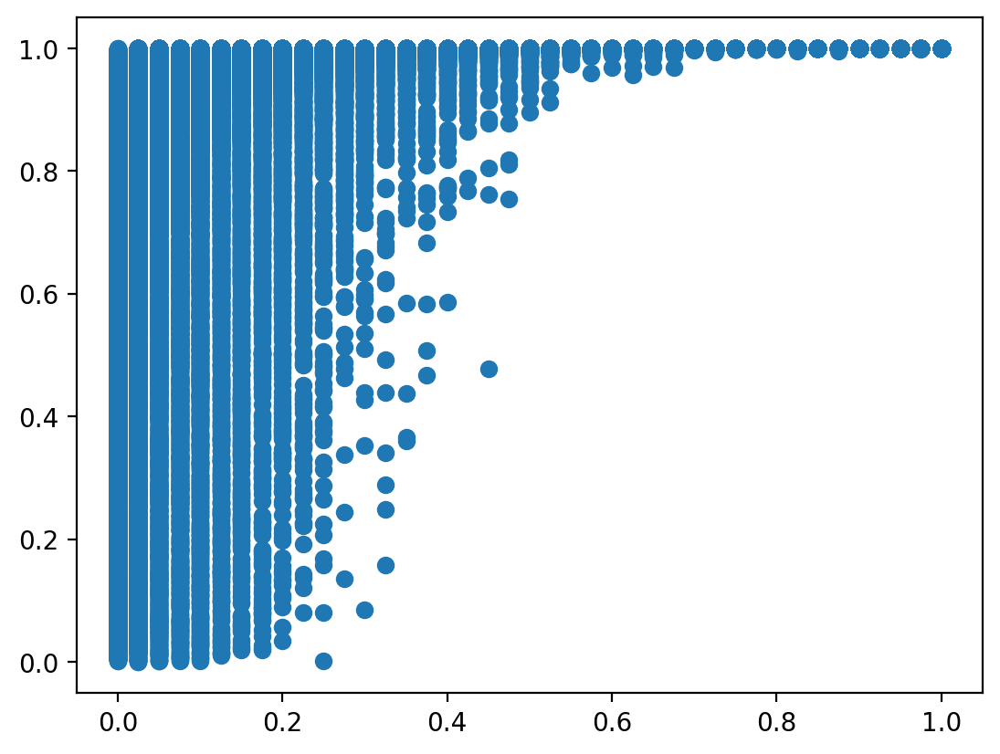

In [21]:
plt.scatter(df_25['delta b'], 1-df_25['p_val'])

In [23]:
# make contour plot of p-values

# make a grid of the parameters
delta_bs = np.unique(df_25['delta b'])
n_totals = np.unique(df_25['n_total'])

# for each parameter, get the quantiles of the p-values
p_val_grid_25 = np.zeros((len(delta_bs), len(n_totals)))
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        p_val_grid_25[ii, jj] = np.quantile(1-df_25[(df_25['delta b'] == delta_b) & (df_25['n_total'] == n_total)]['p_val'], 0.05)


# do the same for the other dataframes
p_val_grid_50 = np.zeros((len(delta_bs), len(n_totals)))
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        p_val_grid_50[ii, jj] = np.quantile(1-df_50[(df_50['delta b'] == delta_b) & (df_50['n_total'] == n_total)]['p_val'], 0.05)

p_val_grid_100 = np.zeros((len(delta_bs), len(n_totals)))
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        p_val_grid_100[ii, jj] = np.quantile(1-df_100[(df_100['delta b'] == delta_b) & (df_100['n_total'] == n_total)]['p_val'], 0.05)

p_val_grid_200 = np.zeros((len(delta_bs), len(n_totals)))
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        p_val_grid_200[ii, jj] = np.quantile(1-df_200[(df_200['delta b'] == delta_b) & (df_200['n_total'] == n_total)]['p_val'], 0.05)


<>:24: SyntaxWarning: invalid escape sequence '\D'
<>:24: SyntaxWarning: invalid escape sequence '\D'
/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_64915/321543394.py:24: SyntaxWarning: invalid escape sequence '\D'
  plt.ylabel('$\Delta b$')


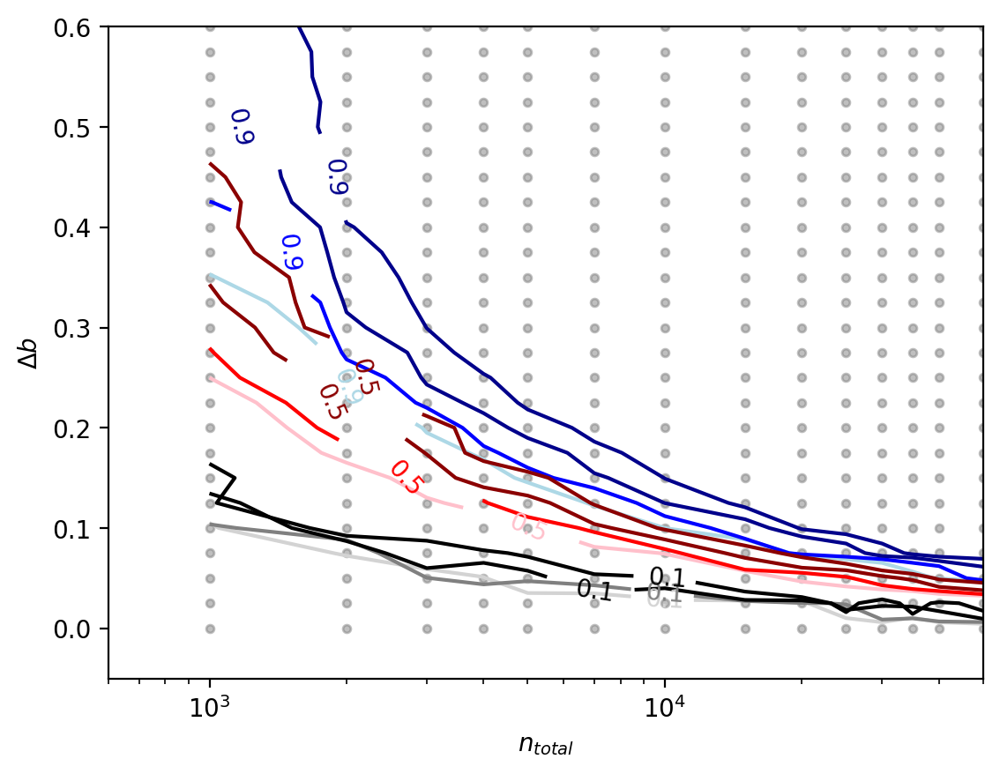

In [24]:
# plot the contour plot
plt.figure()
Contourrange = [0.1,0.5,0.9]
CS = plt.contour(n_totals, delta_bs, p_val_grid_25, levels=Contourrange, colors=['lightgrey','pink','lightblue'])
plt.clabel(CS, fontsize=10, inline=1)

CS = plt.contour(n_totals, delta_bs, p_val_grid_50, levels=Contourrange, colors=['grey','r','b'])
plt.clabel(CS, fontsize=10, inline=1)

CS = plt.contour(n_totals, delta_bs, p_val_grid_100, levels=Contourrange, colors=['k','darkred','darkblue'])
plt.clabel(CS, fontsize=10, inline=1)

CS = plt.contour(n_totals, delta_bs, p_val_grid_200, levels=Contourrange, colors=['k','darkred','darkblue'])
plt.clabel(CS, fontsize=10, inline=1)

# plot grid points
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        plt.scatter(n_total, delta_b, color='grey', alpha=0.5, s=10)
plt.ylim(-0.05, 0.6)
plt.xlim(600, 50000)

plt.xlabel('$n_{total}$')
plt.ylabel('$\Delta b$')

# log x axis
plt.xscale('log')

## Plot for n_series = 25 (it is the one with the best resolution in the case of a somple step function)

<>:29: SyntaxWarning: invalid escape sequence '\D'
<>:29: SyntaxWarning: invalid escape sequence '\D'
/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_64915/3167701020.py:29: SyntaxWarning: invalid escape sequence '\D'
  ax1.set_ylabel('$\Delta b$')


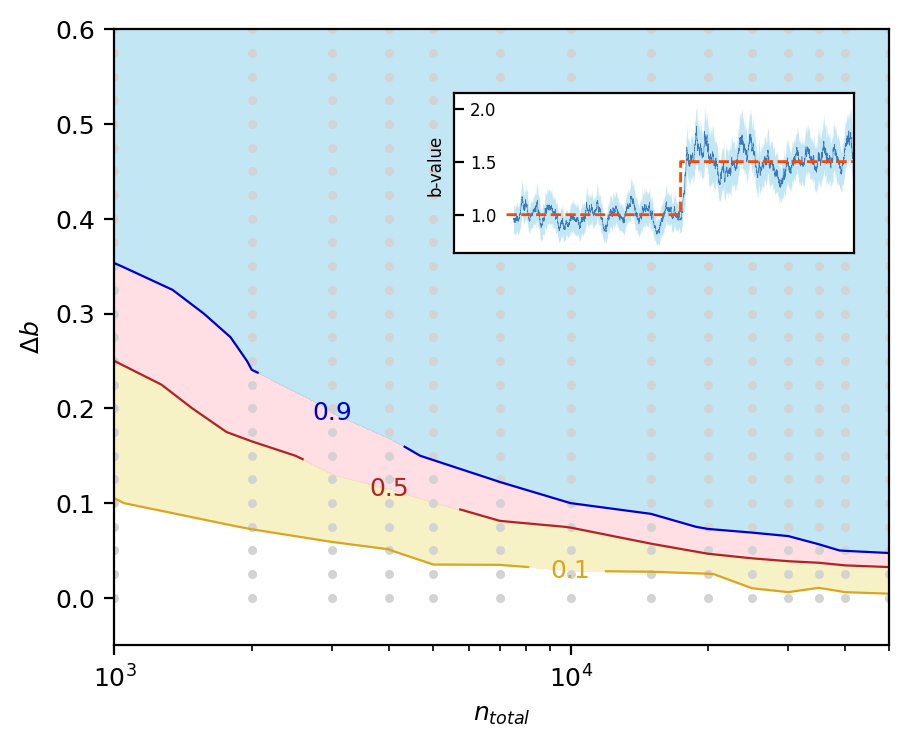

In [32]:
# Create a figure
plt.rcParams.update({'font.size': 9})

fig, ax1 = plt.subplots(figsize=(5, 4))
# These are in unitless percentages of the figure size. (0,0 is bottom left)
left, bottom, width, height = [0.465, 0.6, 0.4, 0.2]
ax2 = fig.add_axes([left, bottom, width, height])

Contourrange = [0.1,0.5, 0.9]
cs = ax1.contour(n_totals, delta_bs, p_val_grid_25, levels=Contourrange, colors=['goldenrod','firebrick', 'mediumblue'], linewidths=0.8)

labels1 = plt.clabel(cs, inline=True, use_clabeltext=True, fontsize=9)
for l in labels1:
    l.set_rotation(0)

Contourrange = [0.1,0.5, 0.9, 1]
cs = ax1.contourf(n_totals, delta_bs, p_val_grid_25, levels=Contourrange, colors=['khaki','pink','skyblue'], alpha=0.5)


# plot grid points
for ii, delta_b in enumerate(delta_bs):
    for jj, n_total in enumerate(n_totals):
        ax1.scatter(n_total, delta_b, color='lightgrey', s=5)

ax1.set_ylim(-0.05, 0.6)
ax1.set_xlim(1000, 50000)

ax1.set_xlabel('$n_{total}$')
ax1.set_ylabel('$\Delta b$')

# log x axis
ax1.set_xscale('log')

# ========
n = 10000
b = 1
delta_b = 0.5
mc = 0
delta_m = 0.1

mags, b_true = mags, b_true = simulate_step(n, b, delta_b, mc, delta_m)

dates = np.arange(len(mags))
b_time, idx_max, b_std = b_any_series(mags, dates, n_m = 200, mc=mc, delta_m=delta_m, return_std=True, overlap=1, method='tinti')

ax2.plot(dates[idx_max], b_time, label='b-value estimate', lw=0.2, color='#3778bf')
ax2.fill_between(dates[idx_max], b_time-1.96*b_std, b_time+1.96*b_std, alpha=0.5, label='95% confidence interval', lw=0, color='skyblue')
ax2.plot(dates, b_true, color='orangered', linestyle='--', label='true b-value', lw=1)
b_all = estimate_b(mags, mc=mc, delta_m=delta_m)
#ax.axhline(b_all, color='gray', linestyle='--')
ax2.set_ylabel('b-value', fontsize=6)
ax2.yaxis.set_label_coords(-0.025,0.55)
ax2.tick_params(axis="y",direction="in", pad=-15, labelsize=6)
ax2.set_xlim(-1500, 10000)
ax2.axes.get_xaxis().set_visible(False)
# ========